In [1]:
from anndata import read_h5ad
import pandas as pd
import numpy as np
import scvi
import scanpy as sc

%load_ext nb_black
use_cuda = True


In [2]:
import sys
data_path = "../../../TabulaSapiensData/"
ts_path = "../"
sys.path.append(ts_path)


In [3]:
import matplotlib.pyplot as plt

%matplotlib inline

In [4]:
adata = read_h5ad(data_path + "decontX/Pilot1_Pilot2.decontX.h5ad")

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/numba/np/ufunc/parallel.py:363: NumbaWarning: The TBB threading layer requires TBB version 2019.5 or later i.e., TBB_INTERFACE_VERSION >= 11005. Found TBB_INTERFACE_VERSION = 9002. The TBB threading layer is disabled.
  warnings.warn(problem)
/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


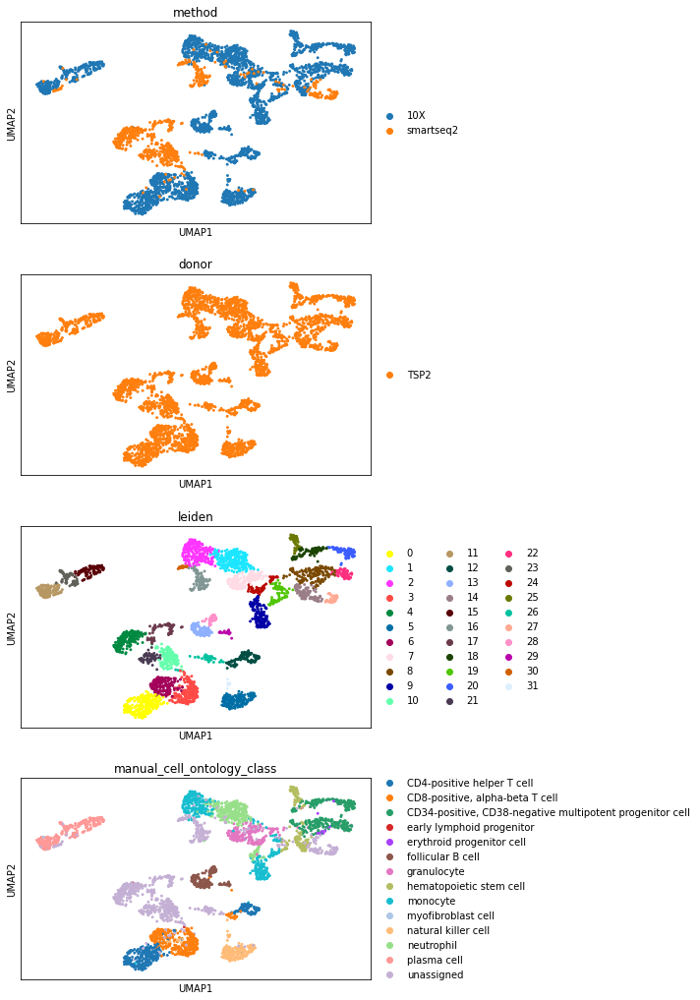

In [5]:
organ = "Bone_Marrow"
organ_adata = adata[adata.obs["tissue"] == organ]
sc.pp.neighbors(organ_adata, use_rep="X_scvi_decontX")
sc.tl.umap(organ_adata)
organ_adata.obsm["X_umap_decontX"] = organ_adata.obsm["X_umap"].copy()
sc.tl.leiden(organ_adata, resolution=2)
sc.pl.umap(
    organ_adata,
    color=["method", "donor", "leiden", "manual_cell_ontology_class"],
    ncols=1,
)
organ_adata.X = np.log1p(organ_adata.X)

# cluster to celltype correspondance
count is a matrix of cluster-cell type correspondance, where each row is a celltype, and each colum is a cluster. The entries to the matrix is the number of cells that is annotated as celltype *X* and cluster *Y*

In [6]:
count = {}
for c in np.unique(organ_adata.obs["leiden"]):
    count[c] = {}
    for t in np.unique(organ_adata.obs["manual_cell_ontology_class"]):
        count[c][t] = np.sum(
            (organ_adata.obs["leiden"].astype(str) == c)
            & (organ_adata.obs["manual_cell_ontology_class"] == t)
        )

count = pd.DataFrame.from_dict(count)

We can visualize the cluster assignment of each cell type through this heatmap. The color is normalized for each celltype 

<AxesSubplot:>

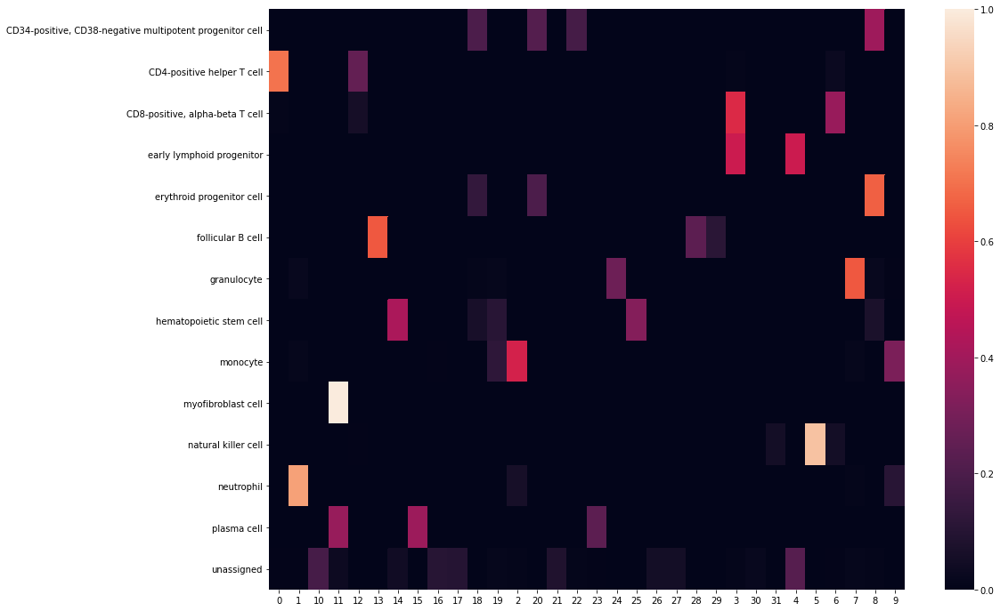

In [7]:
import seaborn

plt.figure(figsize=(16, 12))
seaborn.heatmap((count.T / count.sum(axis=1)).T)

# dictionary of cell type composition of each cluster 
What are clusters previously annotated as 

In [8]:
cluster_composition = {}
for x in count.columns.values:
    t = count.index[count[x] > 0].values
    freq = np.asarray([count.loc[y, x] for y in t]) / count[x].sum()
    res = [a + ": %.2f" % b for a, b in zip(t, freq)]
    cluster_composition[x] = res

In [9]:
cluster_composition["0"]

['CD4-positive helper T cell: 0.97',
 'CD8-positive, alpha-beta T cell: 0.01',
 'monocyte: 0.00',
 'unassigned: 0.02']

# Reassign pure clusters
If a cluster is very pure (>95% of annotated cells come from the same celltype, we reassign the clusters to all have the same labels) 

In [10]:
def Purity(x):
    names = x.index
    x = np.asarray(x).ravel()
    x = x[names != "unassigned"]
    return (np.max(x) / np.sum(x), names[np.argmax(x)])

In [11]:
cluster_purity = count.apply(Purity, axis=0).T
confident_clusters = cluster_purity[cluster_purity[0] > 0.95].index

<ipython-input-1-963029a66ab7>:5: RuntimeWarning: invalid value encountered in long_scalars
  return (np.max(x) / np.sum(x), names[np.argmax(x)])


In [12]:
for i in confident_clusters:
    organ_adata.obs.loc[
        organ_adata.obs["leiden"] == i, "new_manual_cell_ontology_class"
    ] = cluster_purity.loc[i, 1]

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'new_manual_cell_ontology_class' as categorical


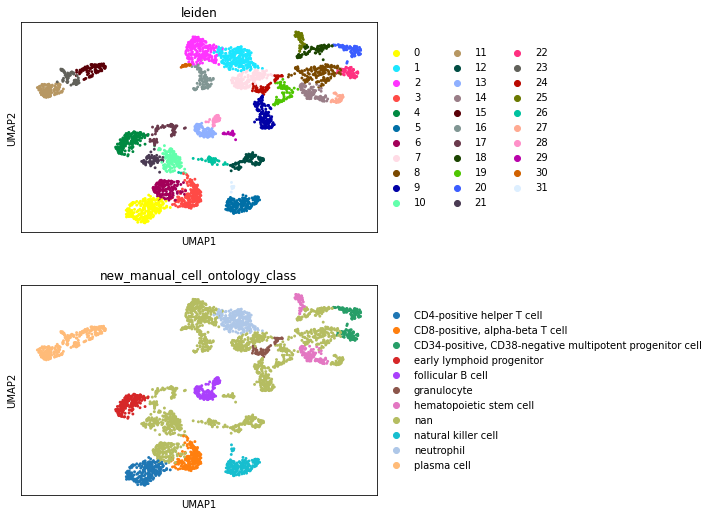

In [13]:
sc.pl.umap(
    organ_adata,
    color=["leiden", "new_manual_cell_ontology_class"],
    ncols=1,
)

In [14]:
organ_adata.obs.groupby(["leiden"]).agg(
    {"new_manual_cell_ontology_class": set, "Propagated.Annotation": set}
)

,new_manual_cell_ontology_class,Propagated.Annotation
leiden,,
0,{CD4-positive helper T cell},"{CD8-positive, alpha-beta T cell, CD4-positive..."
1,{neutrophil},"{granulocyte, neutrophil, monocyte}"
2,{nan},"{neutrophil, monocyte}"
3,"{CD8-positive, alpha-beta T cell}","{CD8-positive, alpha-beta T cell, CD4-positive..."
4,{early lymphoid progenitor},"{CD8-positive, alpha-beta T cell, natural kill..."
5,{natural killer cell},"{CD8-positive, alpha-beta T cell, natural kill..."
6,{nan},"{CD8-positive, alpha-beta T cell, CD4-positive..."
7,{nan},"{granulocyte, neutrophil, monocyte}"
8,{nan},"{cell, erythroid progenitor cell, granulocyte,..."


/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


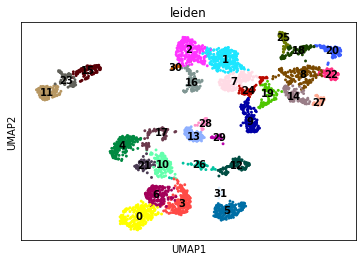

In [15]:
sc.pl.umap(organ_adata, color="leiden", legend_loc="on data")

# Sankey Diagram between cluster and compartment

In [16]:
from utils.colorDict import (
    donor_colors,
    method_colors,
    compartment_colors,
    tissue_colors,
)

In [17]:
from utils.plotting_utils import *
from utils.colorDict import compartment_colors

import plotly
import chart_studio.plotly as py
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

import plotly.io as pio

pio.renderers.default = "notebook"

init_notebook_mode(connected=True)

In [18]:
df = pd.DataFrame(columns=["celltype", "compartment", "count"])
for t in np.unique(organ_adata.obs["manual_cell_ontology_class"]):
    for c in np.unique(organ_adata.obs["compartment_pred_svm"]):
        x = np.sum(
            (organ_adata.obs["compartment_pred_svm"].astype(str) == c)
            & (organ_adata.obs["manual_cell_ontology_class"] == t)
        )
        df = df.append(
            pd.DataFrame([t, c, x], index=["celltype", "compartment", "count"]).T,
            ignore_index=True,
        )


fig = genSankey(
    df,
    cat_cols_color=[compartment_colors(), "#00A1E0"],
    cat_cols=["compartment", "celltype"],
    value_cols="count",
    title="celltype-compartment",
)
iplot(fig, validate=False)
plotly.offline.plot(
    fig, validate=False, filename="figures/celltype_sankey_%s" % organ + ".html"
)  # , output_type='div')

'figures/celltype_sankey_Bone_Marrow.html'

# visualize compartment markers

In [19]:
compartment_markers = {
    "Epithelial": ["CDH1", "CLDN4", "EPCAM"],
    "Endothelial": ["CA4", "CDH5", "CLDN5", "PECAM1", "VWF"],
    "Stromal": ["BGN", "DCN", "COL1A2"],
    "Immune": ["LCP1", "PTPRC", "RAC2"],
}

In [20]:
for x in compartment_markers.keys():
    sc.tl.score_genes(organ_adata, compartment_markers[x], score_name="%s_score" % x)

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead



/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead



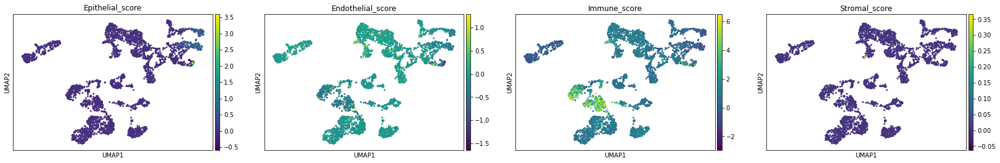

In [21]:
sc.pl.umap(
    organ_adata,
    color=["Epithelial_score", "Endothelial_score", "Immune_score", "Stromal_score"],
)

# Find markers for each cluster

In [22]:
sc.tl.rank_genes_groups(organ_adata, groupby="leiden", method="wilcoxon")

In [23]:
def FormatDE(res):
    groups = res['scores'].dtype.names
    df_res = {}
    for group in groups:
        df = pd.DataFrame([res['scores'][group],
                           res['logfoldchanges'][group],res['pvals_adj'][group]], 
                           columns=res['names'][group],
                           index=['wilcoxon_score','log fold change','adjusted pvalue'])
        df_res[group] = df
    return df_res


In [24]:
DE = FormatDE(organ_adata.uns["rank_genes_groups"])

### top positive marker genes

In [25]:
organ_cluster_genes = pd.DataFrame(organ_adata.uns['rank_genes_groups']['names'])
organ_cluster_genes.iloc[:20]


,0,1,2,3,4,5,6,7,8,9,...,22,23,24,25,26,27,28,29,30,31
0,IL7R,S100A12,AIF1,IL7R,TMSB4X,CD7,GZMK,LYZ,GIHCG,ATP6V0C,...,HBA1,MZB1,CSTA,SPINK2,MKI67,MTCO3P12,MS4A1,MS4A1,CST3,CD7
1,CD3E,S100A9,LST1,GZMA,B2M,NKG7,CD3D,AC020656.1,LMO2,GABARAP,...,HBB,IGKC,LYZ,EGFL7,STMN1,HNRNPA1,CD79A,CD79A,SAT1,PRF1
2,LTB,S100A8,FGL2,CCL5,GNLY,PRF1,TRAC,RNASE2,CDK6,IFITM3,...,AHSP,DERL3,RNASE2,CRHBP,ASPM,RPS6,BANK1,HLA-DQA2,CTSS,PTPRCAP
3,TRAC,VCAN,MS4A7,LYAR,KLRD1,KLRD1,CCL5,S100A8,CYTL1,LST1,...,PRKAR2B,HERPUD1,S100A8,SNHG7,TOP2A,PTMAP5,HLA-DQA1,BLK,FTH1P20,CLIC3
4,CD3D,MNDA,CD163,CD2,TMSB4XP4,CLIC3,CD3E,S100A9,EBPL,AIF1,...,CA2,TENT5C,AZU1,NME2,RRM2,PTMA,TNFRSF13C,FCRLA,FTH1P10,ZAP70
5,CD3G,LYZ,CTSS,FGFBP2,TMSB4XP8,GNLY,IL32,LGALS1,SNHG29,TYROBP,...,PCLAF,BTG2,H2AFZ,SOCS2,NUSAP1,RPL18A,CD79B,CD74,LYZ,CTSW
6,BCL11B,AC020656.1,SERPINA1,CD3D,PFN1,CD247,GZMA,MNDA,LRRC75A,CST3,...,GLRX5,IGHA1,TUBA1B,SYPL1,TUBA1B,HNRNPA1P48,BLK,HLA-DQB1,COTL1,SYTL3
7,IL32,FCN1,CEBPD,CD3E,MT-CO2,GZMB,CD2,MS4A6A,HNRNPAB,IFI30,...,CA1,XBP1,NME2,SNHG29,HMGB2,RPL7A,IGKC,PTPRCAP,FTL,NKG7
8,BTG1,LGALS1,MAFB,GZMB,TMSB4XP1,KLRB1,CCL4,CSTA,GSTM3,NME2,...,TMEM56,IGHG1,CAPG,EBPL,GZMA,RPL3P4,HLA-DRA,CD79B,FTLP3,GZMB
9,TCF7,CYBB,TYROBP,KLF2,MYL12A,CST7,CD3G,MKI67,MYB,SERPINA1,...,MYL4,FCRL5,ENO1,DDAH2,DLGAP5,MT-CO3,HLA-DPA1,HLA-DRB1,CD163,GNLY


In [26]:
for x in DE.keys():
    print(x)
    display(DE[x].T[:20])

0


,wilcoxon_score,log fold change,adjusted pvalue
IL7R,20.413589,3.410172,7.454995e-88
CD3E,20.215588,2.935971,2.101331e-86
LTB,19.949141,3.119579,2.992291e-84
TRAC,19.710011,2.475083,2.604003e-82
CD3D,19.452110,2.345593,3.292962e-80
CD3G,19.108761,1.908552,2.094597e-77
BCL11B,18.402611,2.968351,1.052818e-71
IL32,17.516207,2.355121,7.931057e-65
BTG1,15.271455,1.423722,6.976120e-49
TCF7,14.943156,2.882038,9.237335e-47


1


,wilcoxon_score,log fold change,adjusted pvalue
S100A12,24.796947,5.778829,5.693272e-131
S100A9,24.411568,7.175257,3.793905e-127
S100A8,24.086935,7.169396,6.723631e-124
VCAN,23.917128,4.956535,2.990840e-122
MNDA,23.604643,4.539203,4.065969e-119
LYZ,22.077446,5.580549,5.108947e-104
AC020656.1,22.067877,4.499965,5.411219e-104
FCN1,21.754103,3.833854,4.648543e-101
LGALS1,21.534628,4.075787,4.826389e-99
CYBB,21.326483,3.460681,3.795756e-97


2


,wilcoxon_score,log fold change,adjusted pvalue
AIF1,24.000748,4.831085,1.607864e-122
LST1,23.389694,4.516236,1.601601e-116
FGL2,23.161716,4.199367,2.173812e-114
MS4A7,23.064306,5.019594,1.555609e-113
CD163,22.990427,4.639168,6.842517e-113
CTSS,22.852100,4.031209,1.366532e-111
SERPINA1,22.356163,4.352191,8.845328e-107
CEBPD,22.047094,3.827958,7.495330e-104
MAFB,22.002832,4.808909,1.769688e-103
TYROBP,21.967293,4.107040,3.484700e-103


3


,wilcoxon_score,log fold change,adjusted pvalue
IL7R,17.684753,3.250411,3.235579e-65
GZMA,16.883640,2.687858,1.164990e-59
CCL5,16.564251,2.819565,1.859459e-57
LYAR,16.294674,1.986956,1.267795e-55
CD2,16.265345,1.936607,1.706129e-55
FGFBP2,16.131594,2.044142,1.126053e-54
CD3D,15.638779,1.993659,2.332746e-51
CD3E,15.612750,2.291830,3.190283e-51
GZMB,15.128340,1.404634,4.133396e-48
KLF2,14.788059,1.946700,5.419940e-46


4


,wilcoxon_score,log fold change,adjusted pvalue
TMSB4X,21.440985,7.537233,3.263031e-97
B2M,21.061796,6.612406,5.247849e-94
GNLY,20.982464,10.859005,1.861257e-93
KLRD1,20.965031,8.000569,2.013860e-93
TMSB4XP4,20.944372,5.675482,2.486197e-93
TMSB4XP8,20.800432,7.831728,4.208439e-92
PFN1,20.620417,7.001957,1.513840e-90
MT-CO2,20.514824,6.542969,1.168168e-89
TMSB4XP1,20.229361,6.414350,3.532170e-87
MYL12A,19.916023,7.008924,1.739887e-84


5


,wilcoxon_score,log fold change,adjusted pvalue
CD7,18.618980,3.568182,6.636505e-73
NKG7,17.881166,3.409077,9.733494e-68
PRF1,17.814333,2.828732,2.683797e-67
KLRD1,17.758335,3.268444,6.247726e-67
CLIC3,17.217907,3.231565,4.249782e-63
GNLY,17.210003,4.082516,4.697457e-63
CD247,17.003487,2.362813,1.380355e-61
GZMB,16.867109,2.523617,1.321165e-60
KLRB1,16.102985,2.558424,2.920546e-55
CST7,15.842624,1.915360,1.692085e-53


6


,wilcoxon_score,log fold change,adjusted pvalue
GZMK,15.528207,4.545156,1.316007e-49
CD3D,15.466202,2.310709,1.726882e-49
TRAC,14.934938,2.028515,3.831534e-46
CCL5,14.859279,3.124655,8.914953e-46
CD3E,14.561153,2.479792,5.841543e-44
IL32,14.494252,2.523462,1.292477e-43
GZMA,13.787074,2.385580,2.564015e-39
CD2,13.692480,1.853253,8.285907e-39
CCL4,13.120441,2.167993,1.644871e-35
CD3G,13.083338,1.536780,2.413850e-35


7


,wilcoxon_score,log fold change,adjusted pvalue
LYZ,20.249220,6.792106,2.124679e-86
AC020656.1,19.153683,5.539875,2.654421e-77
RNASE2,19.106022,4.312350,4.414855e-77
S100A8,18.406647,6.464669,1.710153e-71
S100A9,17.945114,6.077505,6.169941e-68
LGALS1,17.912027,4.251141,9.322227e-68
MNDA,17.763500,4.094512,1.139685e-66
MS4A6A,16.794266,3.357508,1.978110e-59
CSTA,16.287138,3.316143,7.966853e-56
MKI67,15.271124,4.198455,7.011578e-49


8


,wilcoxon_score,log fold change,adjusted pvalue
GIHCG,18.355017,4.857277,1.771982e-70
LMO2,17.005379,3.670244,2.205289e-60
CDK6,16.819914,3.611321,3.422540e-59
CYTL1,16.574995,4.157610,1.555217e-57
EBPL,16.306580,3.556530,1.043381e-55
SNHG29,16.120962,3.650412,1.783349e-54
LRRC75A,16.090944,4.230930,2.483432e-54
HNRNPAB,16.073584,3.095946,2.876000e-54
GSTM3,15.945723,4.320631,1.995641e-53
MYB,15.843712,3.571274,9.146829e-53


9


,wilcoxon_score,log fold change,adjusted pvalue
ATP6V0C,15.540580,3.353475,1.085021e-49
GABARAP,15.079212,2.140326,4.354452e-47
IFITM3,15.040017,3.097492,5.908262e-47
LST1,14.686562,2.783129,9.254630e-45
AIF1,14.462436,2.795788,1.759861e-43
TYROBP,14.150760,2.620889,1.087634e-41
CST3,14.023309,2.893250,6.007788e-41
IFI30,13.680072,3.816495,6.048210e-39
NME2,13.583985,2.186156,1.956029e-38
SERPINA1,13.528972,2.852494,3.881339e-38


10


,wilcoxon_score,log fold change,adjusted pvalue
MT-CO1,18.855396,6.694870,1.562086e-74
FP671120.5,18.607555,5.761861,8.214350e-73
CCL5,18.494223,8.094628,4.510111e-72
MT-ND5,18.368048,6.313281,3.484813e-71
ACTB,18.224117,6.489562,3.911268e-70
TMSB4XP8,18.169725,7.374042,8.795747e-70
B2M,18.103416,6.190745,2.518780e-69
MALAT1,18.075758,5.900664,3.640416e-69
EEF1A1P5,18.043591,6.076663,5.795179e-69
MTCO1P12,18.030386,4.140182,6.623195e-69


11


,wilcoxon_score,log fold change,adjusted pvalue
DERL3,18.261646,7.720055,9.841457e-70
MZB1,18.156511,8.313304,3.356961e-69
PRDX4,17.968382,6.186991,6.069408e-68
IGKC,17.958418,13.315434,6.069408e-68
SPAG4,17.782646,7.159502,1.134135e-66
TNFRSF17,17.721575,7.093341,2.804159e-66
SEC11C,17.588894,5.806566,2.520267e-65
SDF2L1,17.486370,5.078681,1.339190e-64
SSR4,17.448328,5.936878,2.180955e-64
SSR3,17.445805,4.540040,2.180955e-64


12


,wilcoxon_score,log fold change,adjusted pvalue
CD3E,13.939523,2.833876,7.150169e-40
PTPRCAP,13.591014,5.210755,6.663583e-38
IFITM1,11.709351,1.408316,5.169263e-28
IL32,11.116410,2.104783,3.414075e-25
LTB,11.015581,2.185040,9.011437e-25
IL7R,10.565055,2.054186,9.797702e-23
CD3D,9.473643,1.212635,3.535461e-18
LCK,9.464219,1.243871,3.785111e-18
CD3G,7.799311,0.573433,4.311106e-12
LEF1,7.623912,1.886994,1.509158e-11


13


,wilcoxon_score,log fold change,adjusted pvalue
IGHM,16.655674,5.633155,1.620249e-57
AL139020.1,16.417776,5.662883,4.200379e-56
MS4A1,16.104118,4.949278,4.683661e-54
CD79A,16.083988,4.751588,4.862803e-54
IGHD,15.790411,4.610049,4.264684e-52
CD79B,14.468579,3.078378,1.877810e-43
IGKC,14.090485,3.786790,3.654741e-41
HLA-DQA1,13.800714,4.255638,1.856889e-39
IGLC2,13.480250,3.190310,1.337078e-37
LINC00926,13.348715,4.150231,6.449499e-37


14


,wilcoxon_score,log fold change,adjusted pvalue
SPINK2,14.687717,7.711797,4.549066e-44
AVP,13.966093,8.721776,7.388905e-40
CRHBP,13.802263,9.156561,4.846496e-39
GAS5,13.174208,4.198120,1.817874e-35
MLLT3,13.147618,4.979946,2.067747e-35
SOCS2,13.092703,5.671343,3.556507e-35
FAM30A,12.464647,4.889071,9.788069e-32
ZFAS1,12.010024,3.350368,2.316180e-29
LAPTM4B,11.870902,5.423138,1.092388e-28
CD164,11.862409,2.830821,1.092388e-28


15


,wilcoxon_score,log fold change,adjusted pvalue
MZB1,15.594892,6.493836,4.642332e-50
DERL3,15.482347,5.692417,1.343739e-49
SPAG4,15.089249,5.422111,2.805167e-47
PRDX4,14.985662,4.374622,1.072759e-46
ITM2C,14.955948,4.284849,1.397571e-46
TNFRSF17,14.803456,4.873758,9.101568e-46
IGHG1,14.745691,7.755145,1.930608e-45
GAS6,14.639364,4.500526,8.430999e-45
ERLEC1,14.397826,3.345123,2.245330e-43
HERPUD1,14.361601,4.363555,3.536972e-43


16


,wilcoxon_score,log fold change,adjusted pvalue
AL512646.1,12.324602,4.698735,2.620599e-31
S100A9,11.564167,5.658831,1.151571e-27
S100A8,9.922956,4.938532,2.434346e-20
MT-RNR2,7.910515,1.735345,6.766786e-13
GRK2,6.958890,2.758938,5.955836e-10
CTSD,6.533896,2.925886,9.090119e-09
SNORD3A,6.180951,2.452829,7.830888e-08
CYBB,6.101141,2.258325,1.242451e-07
GRN,5.930425,2.175125,3.294017e-07
RNASE2,5.838685,2.457910,5.501623e-07


17


,wilcoxon_score,log fold change,adjusted pvalue
RPS27,12.829163,4.448621,6.627215e-33
AC005912.1,12.578332,4.970759,8.178059e-32
AC090498.1,12.129776,5.811264,1.441333e-29
RPL21,11.976099,4.183768,6.977784e-29
RPL41P1,11.577069,5.885586,6.341015e-27
MT-RNR2,11.342349,4.211158,7.319239e-26
MT-CO3,11.336002,4.611963,7.319239e-26
RPL13AP5,11.303888,4.647583,9.237675e-26
MTCO3P12,11.252573,3.757814,1.471319e-25
RPL21P16,11.221924,4.167580,1.873656e-25


18


,wilcoxon_score,log fold change,adjusted pvalue
GIHCG,12.978772,4.248949,9.504458e-34
PRSS57,12.346215,4.139731,1.502869e-30
NME2,12.117028,3.259724,1.683966e-29
MIF,11.934872,2.999306,1.146176e-28
NFE2,11.894567,3.131305,1.487118e-28
CDK6,11.638312,2.877754,2.582158e-27
SNHG7,11.613848,2.802218,2.947559e-27
IMPDH2,11.562857,2.712923,4.677117e-27
EGFL7,11.536114,3.665039,5.674877e-27
SNHG29,11.503404,3.361079,7.465543e-27


19


,wilcoxon_score,log fold change,adjusted pvalue
HLA-DRA,13.581538,5.279754,3.033712e-37
HLA-DPA1,13.413991,4.869048,1.473808e-36
HLA-DPB1,13.269148,4.478052,5.758782e-36
NAPSB,13.260688,6.815749,5.758782e-36
HLA-DRB1,13.130744,4.376581,2.584283e-35
HLA-DQB1,12.892248,5.183309,4.883425e-34
CD74,12.768907,5.080934,2.056792e-33
HLA-DMA,12.568450,3.737766,2.316787e-32
LSP1,12.532321,3.138907,3.250067e-32
GSN,11.923748,3.576107,5.240147e-29


20


,wilcoxon_score,log fold change,adjusted pvalue
HBB,14.268632,9.734675,2.020687e-41
AHSP,14.203661,7.706129,2.559347e-41
KCNH2,14.049318,5.887816,1.269515e-40
KLF1,14.041987,5.643426,1.269515e-40
CA1,13.951834,8.560294,3.522230e-40
CA2,13.940585,6.042665,3.522230e-40
SYNGR1,13.850767,5.383206,1.004332e-39
GSTM3,13.844947,6.695197,1.004332e-39
FAM178B,13.802193,6.300782,1.617080e-39
HEBP1,13.692676,4.733512,6.610906e-39


21


,wilcoxon_score,log fold change,adjusted pvalue
EEF1A1P5,13.548227,7.496314,4.472981e-37
EEF1A1P6,13.502110,6.223702,4.472981e-37
EEF1A1,13.468255,6.155259,4.719046e-37
RPS2P46,13.354429,5.934452,1.642623e-36
RPL18AP3,13.327909,6.386108,1.875600e-36
RPL13AP5,13.252983,6.700222,3.872999e-36
RPLP2,13.248466,4.685672,3.872999e-36
RPL10P16,13.195366,5.695916,6.444674e-36
RPL23,13.191259,5.962064,6.444674e-36
RPS3,13.152828,5.690926,8.833555e-36


22


,wilcoxon_score,log fold change,adjusted pvalue
HBA1,14.072148,10.692213,3.316260e-40
HBB,13.959573,12.121125,8.096907e-40
AHSP,13.920393,9.246235,9.346150e-40
PRKAR2B,13.828915,5.952411,2.510436e-39
CA2,13.800668,7.576445,2.972985e-39
PCLAF,13.712912,6.111140,7.008503e-39
GLRX5,13.705052,5.614131,7.008503e-39
CA1,13.704638,9.634881,7.008503e-39
TMEM56,13.681710,6.362859,8.541743e-39
MYL4,13.673554,6.745015,8.599779e-39


23


,wilcoxon_score,log fold change,adjusted pvalue
MZB1,12.335547,5.342456,1.492002e-31
IGKC,11.934913,7.794367,1.205912e-29
DERL3,10.561205,3.785618,2.823491e-23
HERPUD1,9.632387,2.707916,2.705143e-19
TENT5C,9.538239,3.374247,6.479143e-19
BTG2,9.405594,3.164610,2.144900e-18
IGHA1,9.298974,5.885752,5.640669e-18
XBP1,9.224317,2.484207,1.112589e-17
IGHG1,9.071042,6.658080,4.448606e-17
FCRL5,8.918488,3.078302,1.686527e-16


24


,wilcoxon_score,log fold change,adjusted pvalue
CSTA,9.882206,2.825264,9.757853e-19
LYZ,9.474376,4.214345,3.159681e-17
RNASE2,9.204527,2.595885,3.367153e-16
S100A8,9.172205,4.728207,3.897521e-16
AZU1,8.744765,4.886760,1.644526e-14
H2AFZ,8.637486,1.881913,3.382879e-14
TUBA1B,8.446134,2.191299,1.611483e-13
NME2,8.225517,2.147591,8.801065e-13
CAPG,8.216343,2.238064,8.822239e-13
ENO1,8.037643,1.518765,3.594327e-12


25


,wilcoxon_score,log fold change,adjusted pvalue
SPINK2,11.033731,4.664848,1.546722e-23
EGFL7,10.237673,3.697030,3.956976e-20
CRHBP,9.670186,4.601554,7.920836e-18
SNHG7,9.582017,2.719438,1.400632e-17
NME2,9.116125,2.787937,7.639216e-16
SOCS2,8.990685,3.403227,1.808008e-15
SYPL1,8.674546,2.409511,2.715894e-14
SNHG29,8.366423,2.592085,3.178656e-13
EBPL,8.275181,2.102062,6.292247e-13
DDAH2,8.256011,2.679062,6.820845e-13


26


,wilcoxon_score,log fold change,adjusted pvalue
MKI67,10.115766,5.321569,2.768814e-19
STMN1,9.741782,5.063323,5.887429e-18
ASPM,9.199552,5.270071,7.053549e-16
TOP2A,9.128679,4.936479,1.020512e-15
RRM2,9.072083,5.106289,1.374757e-15
NUSAP1,9.044847,4.710280,1.470510e-15
TUBA1B,8.942127,4.187508,3.210518e-15
HMGB2,8.677089,3.903131,2.987868e-14
GZMA,8.475088,4.166253,1.536520e-13
DLGAP5,8.347914,4.453879,4.090260e-13


27


,wilcoxon_score,log fold change,adjusted pvalue
MTCO3P12,11.222001,7.854653,5.455507e-26
HNRNPA1,11.221852,9.688365,5.455507e-26
RPS6,11.213040,8.481090,5.455507e-26
PTMAP5,11.212670,6.897747,5.455507e-26
PTMA,11.210967,7.568754,5.455507e-26
RPL18A,11.205265,6.550647,5.455507e-26
HNRNPA1P48,11.204081,7.524180,5.455507e-26
RPL7A,11.204006,7.131678,5.455507e-26
RPL3P4,11.203414,8.009632,5.455507e-26
MT-CO3,11.202377,8.649921,5.455507e-26


28


,wilcoxon_score,log fold change,adjusted pvalue
MS4A1,10.362772,5.662984,2.155783e-20
CD79A,10.264614,5.570803,2.994320e-20
BANK1,9.578051,4.625469,1.940629e-17
HLA-DQA1,9.424483,4.951735,6.361337e-17
TNFRSF13C,8.945131,4.499153,4.374123e-15
CD79B,8.909445,3.262515,5.032274e-15
BLK,8.421805,5.088435,3.117821e-13
IGKC,8.397170,3.255193,3.365662e-13
HLA-DRA,8.264016,3.488448,9.213227e-13
HLA-DPA1,7.950972,2.833288,1.089410e-11


29


,wilcoxon_score,log fold change,adjusted pvalue
MS4A1,6.560735,4.585428,0.000002
CD79A,6.531647,3.986406,0.000002
HLA-DQA2,6.174254,5.780124,0.000013
BLK,6.064228,4.699830,0.000020
FCRLA,5.716273,4.732409,0.000107
CD74,5.637445,3.372739,0.000129
HLA-DQB1,5.625343,3.751235,0.000129
PTPRCAP,5.614462,4.802524,0.000129
CD79B,5.393188,2.343009,0.000355
HLA-DRB1,5.260623,2.661689,0.000604


30


,wilcoxon_score,log fold change,adjusted pvalue
CST3,7.447165,7.680998,8.758520e-10
SAT1,7.439060,10.451259,8.758520e-10
CTSS,7.435507,8.926364,8.758520e-10
FTH1P20,7.434064,8.751277,8.758520e-10
FTH1P10,7.394428,6.034805,8.758520e-10
LYZ,7.391763,9.328306,8.758520e-10
COTL1,7.383991,8.860025,8.758520e-10
FTL,7.366227,7.738936,8.758520e-10
FTLP3,7.365006,7.125596,8.758520e-10
CD163,7.363785,8.907899,8.758520e-10


31


,wilcoxon_score,log fold change,adjusted pvalue
CD7,4.939979,4.033003,0.039235
PRF1,4.598063,3.395196,0.039235
PTPRCAP,4.566576,4.410104,0.039235
CLIC3,4.220228,3.187810,0.069269
ZAP70,4.211515,2.643158,0.069269
CTSW,4.163216,2.195622,0.073893
SYTL3,4.118432,2.483998,0.075955
NKG7,4.115069,3.035440,0.075955
GZMB,4.090614,2.074626,0.081702
GNLY,4.056530,3.432238,0.086240


### for cluster 0 plot the top marker genes

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead



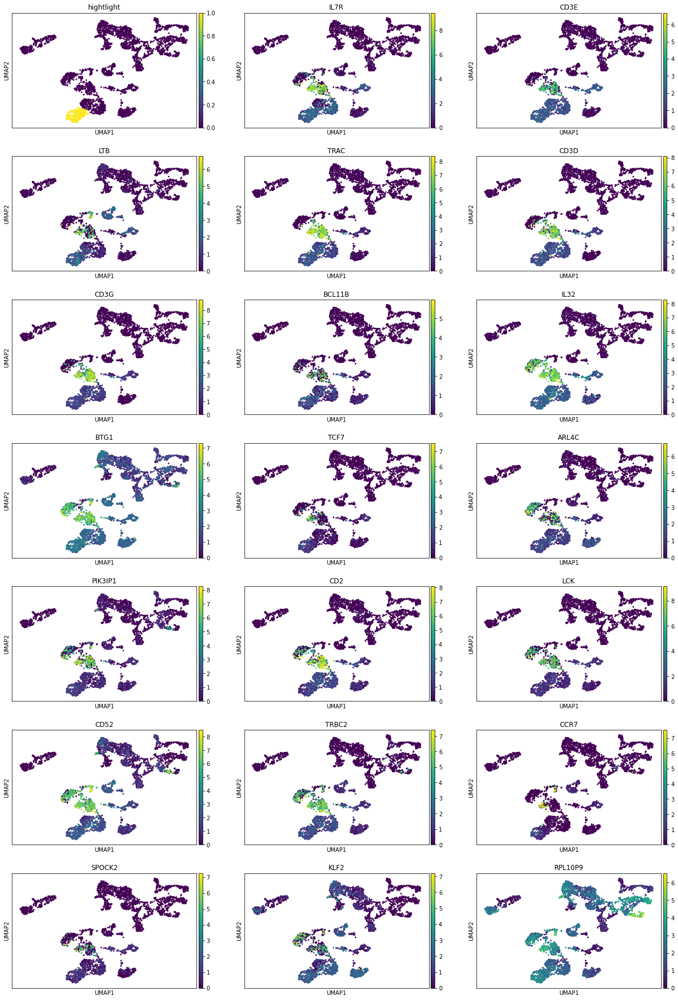

In [27]:
topgenes = list(DE["0"].T[:20].index)
organ_adata.obs["hightlight"] = organ_adata.obs["leiden"] == "0"
sc.pl.umap(
    organ_adata,
    color=["hightlight"] + topgenes,
    ncols=3,
)

You can do this for other clusters as well. Here I plot the top 5 genes for all other clusters

0


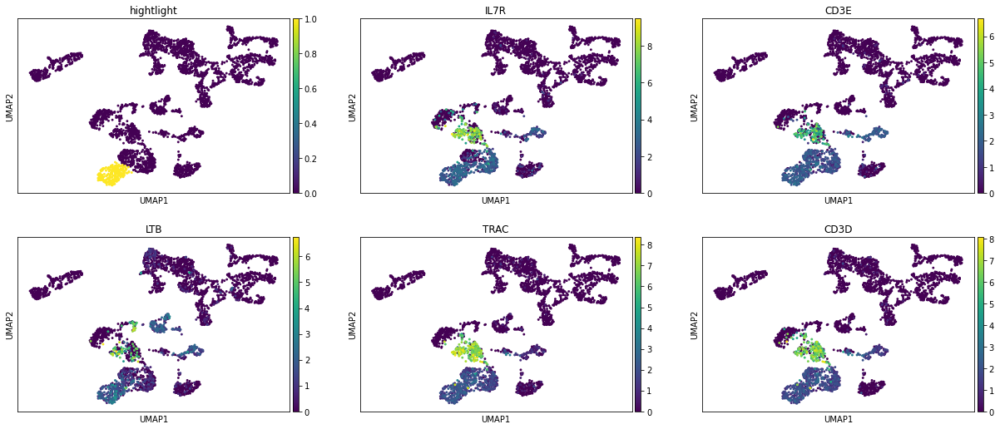

1


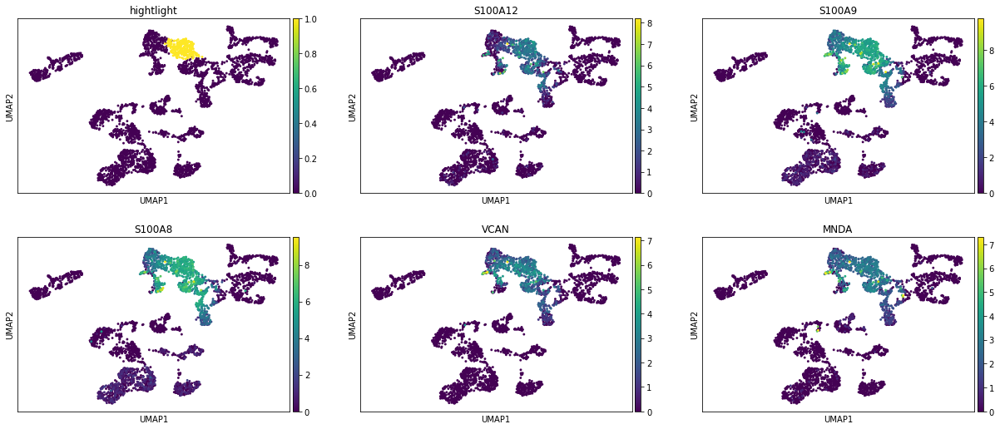

2


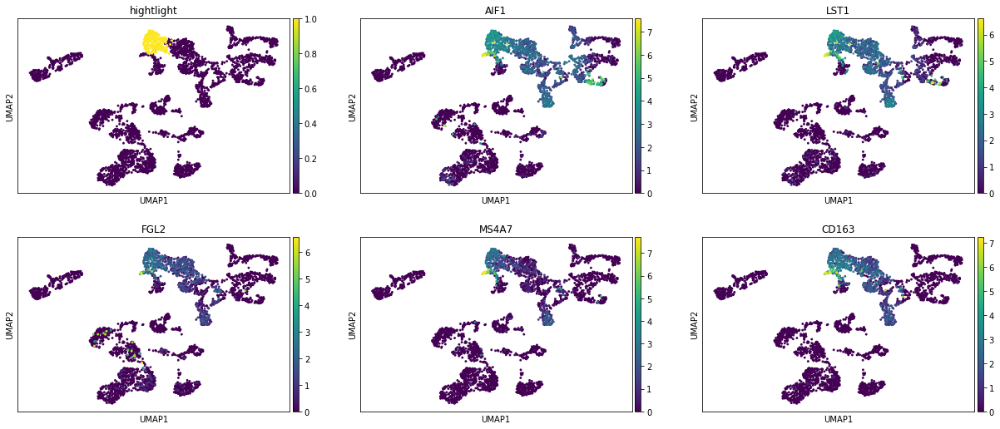

3


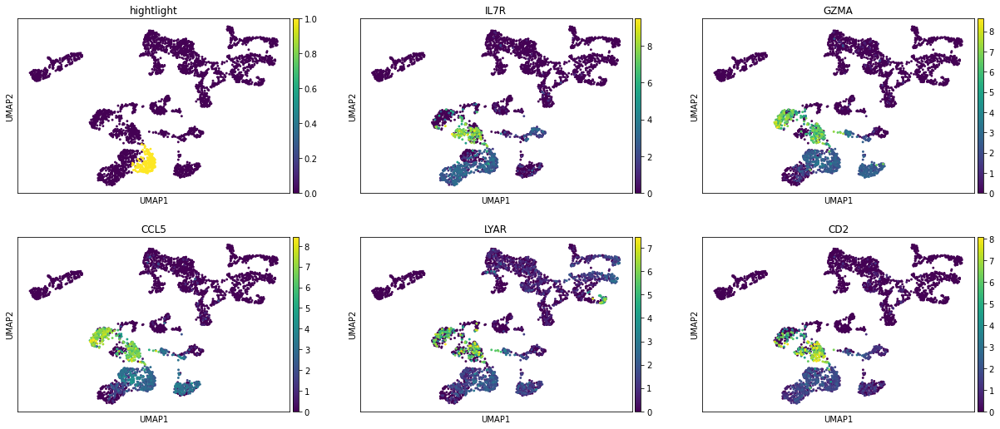

4


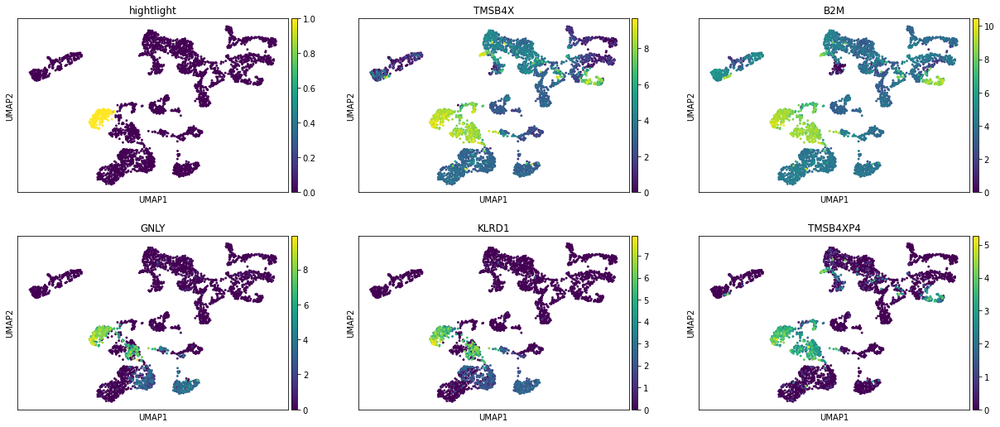

5


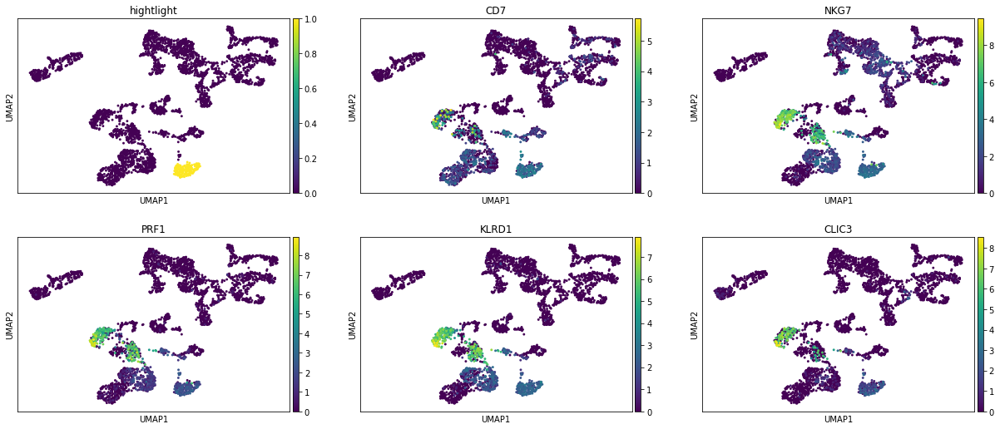

6


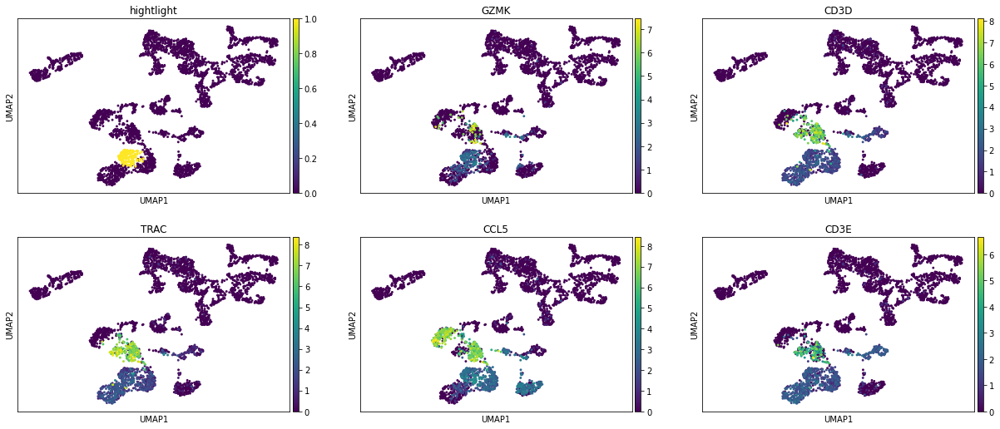

7


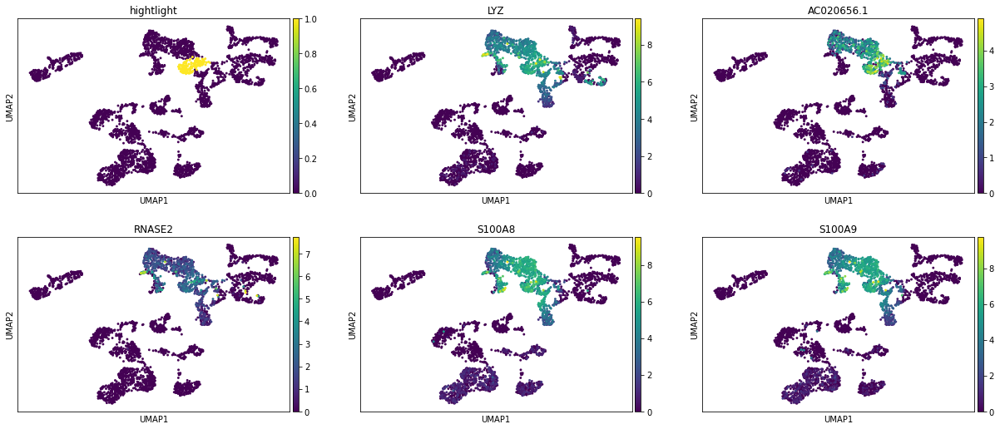

8


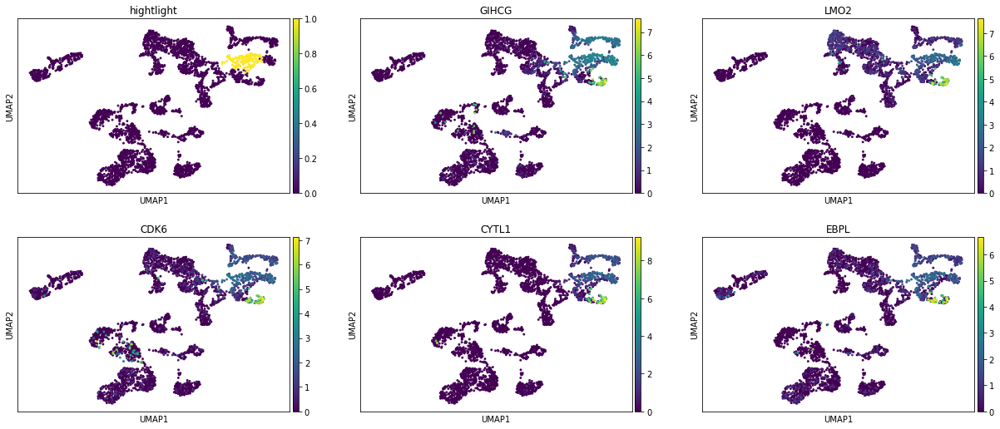

9


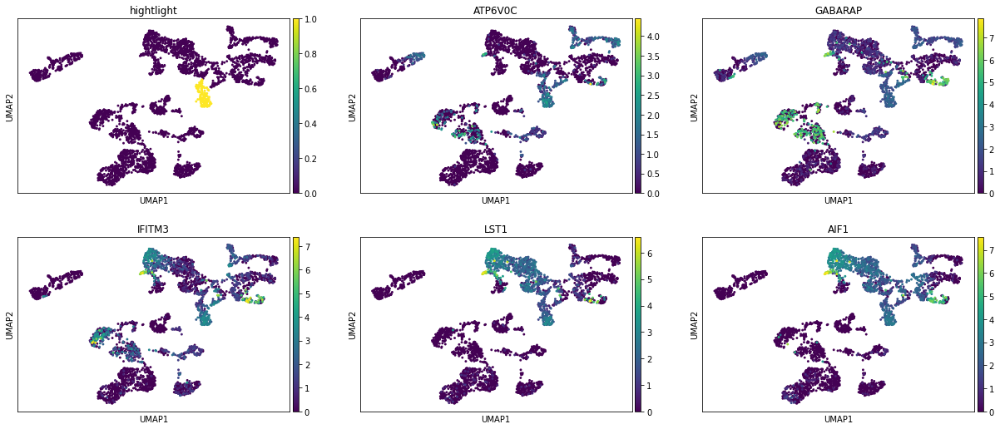

10


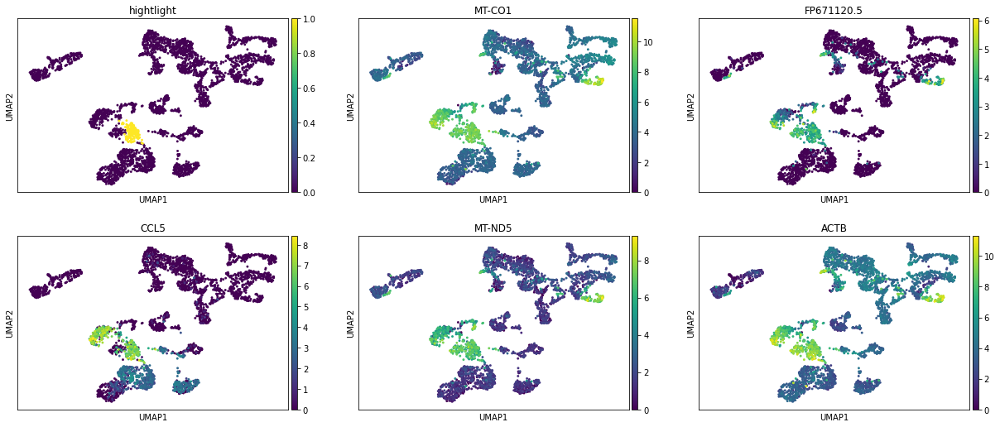

11


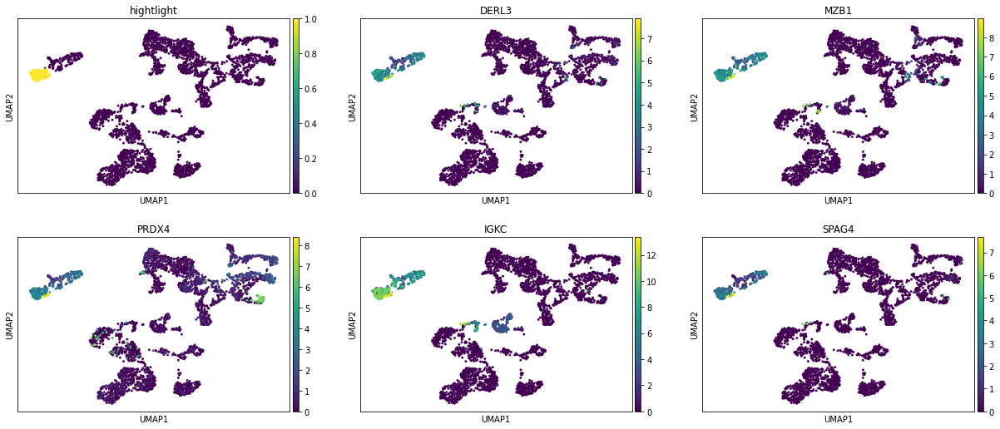

12


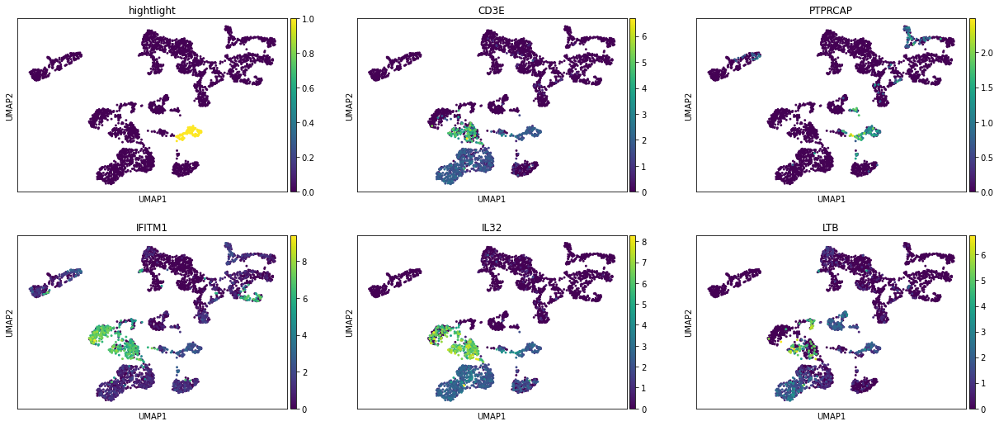

13


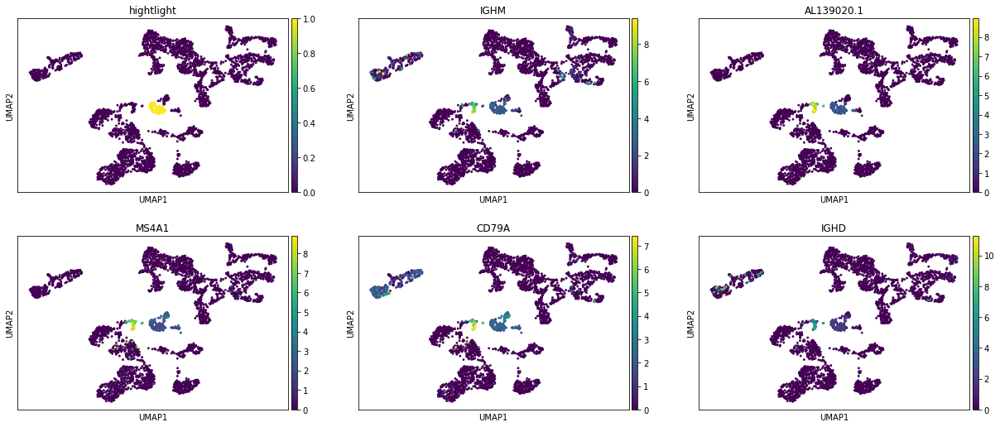

14


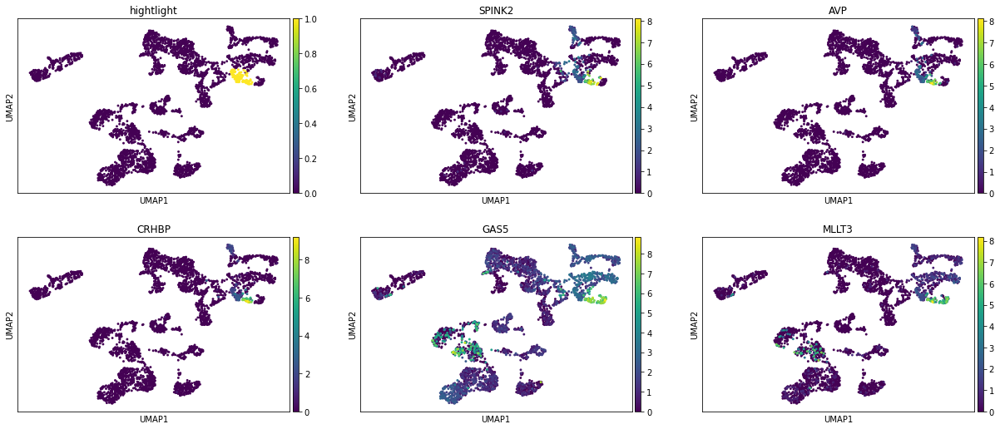

15


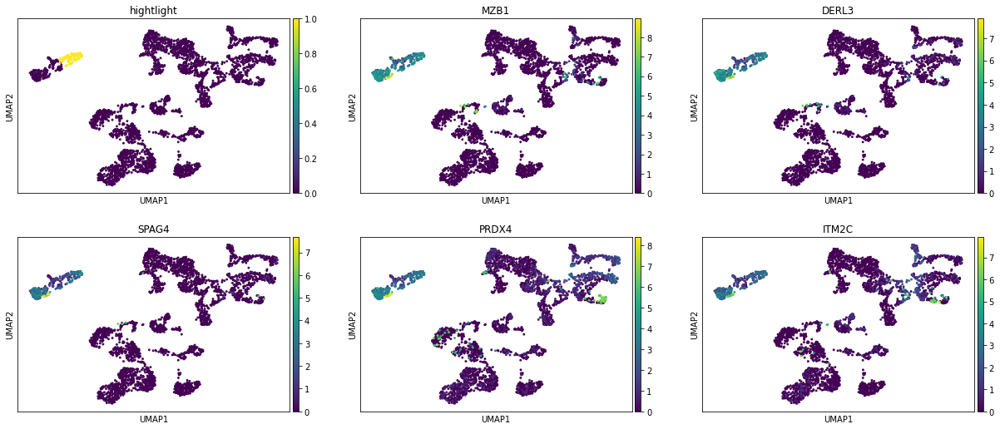

16


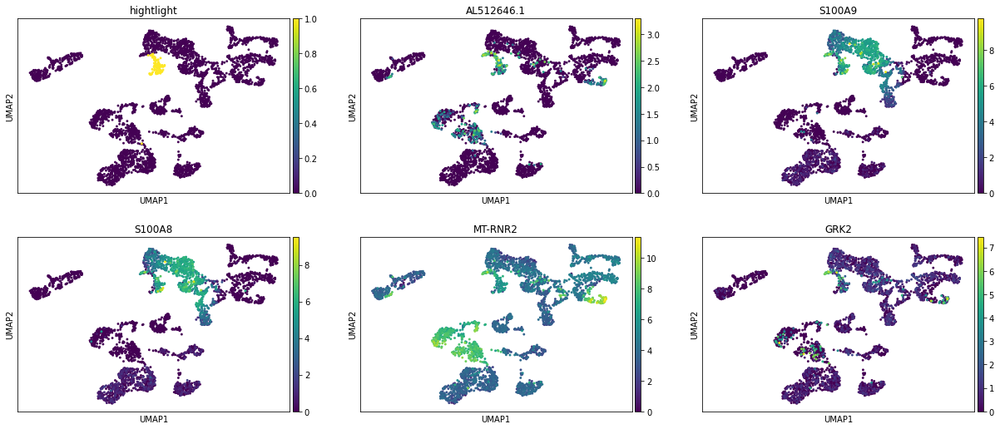

17


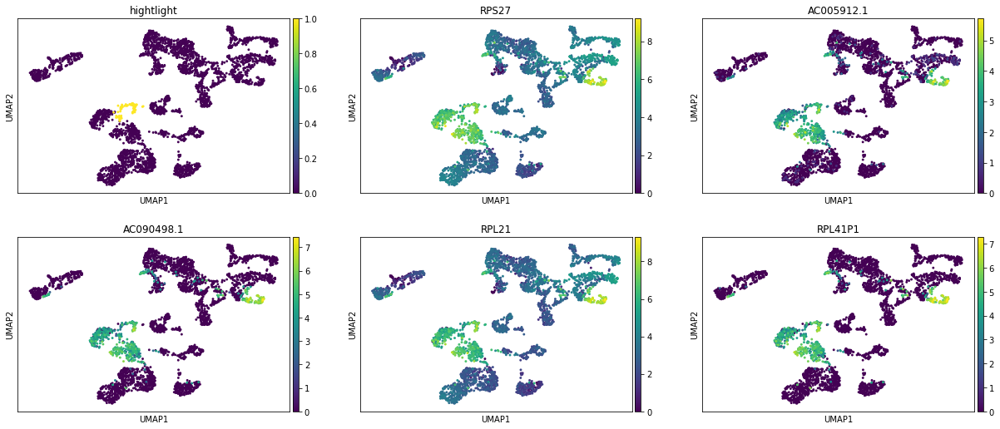

18


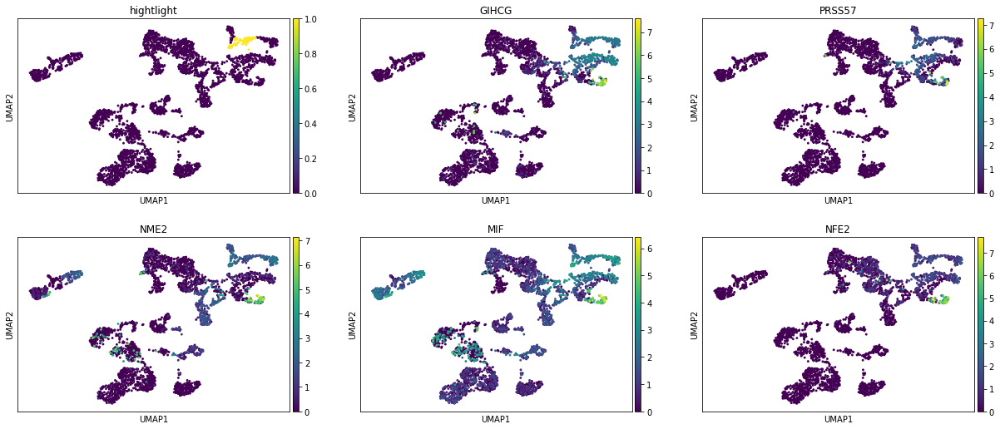

19


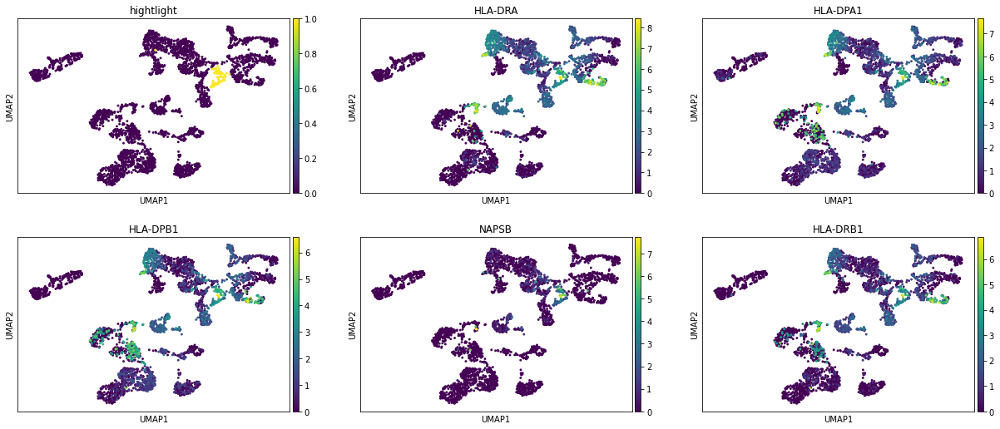

20


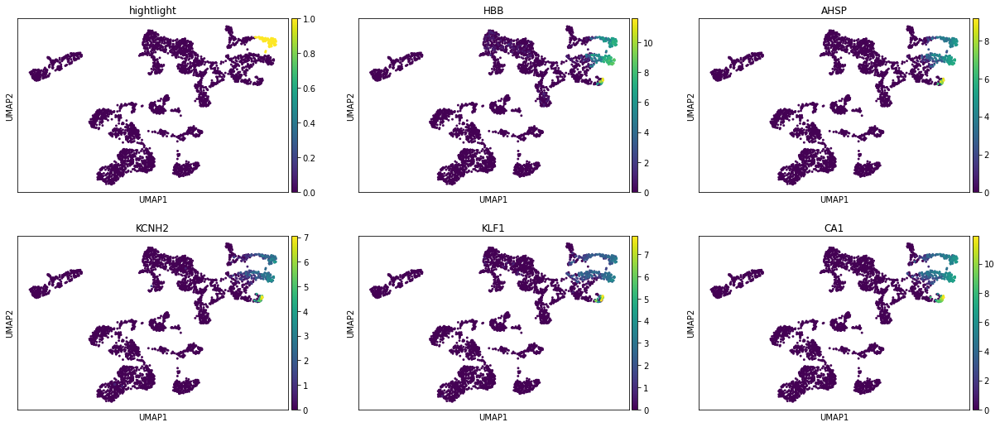

21


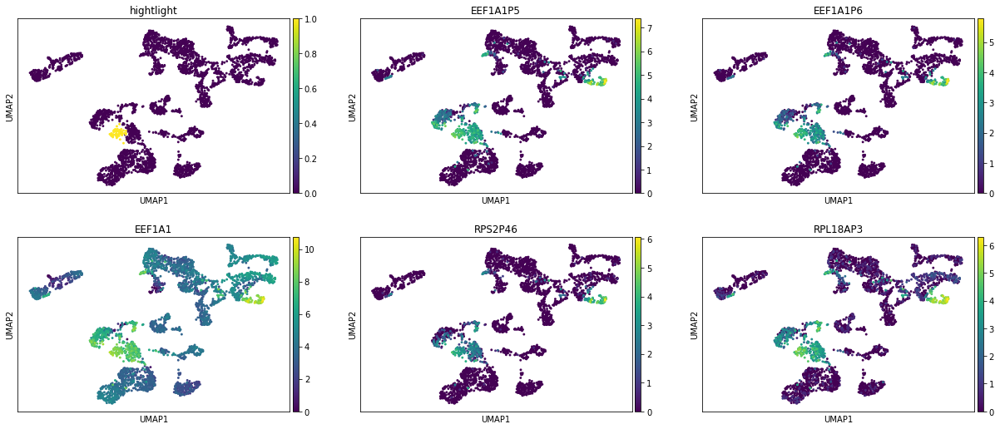

22


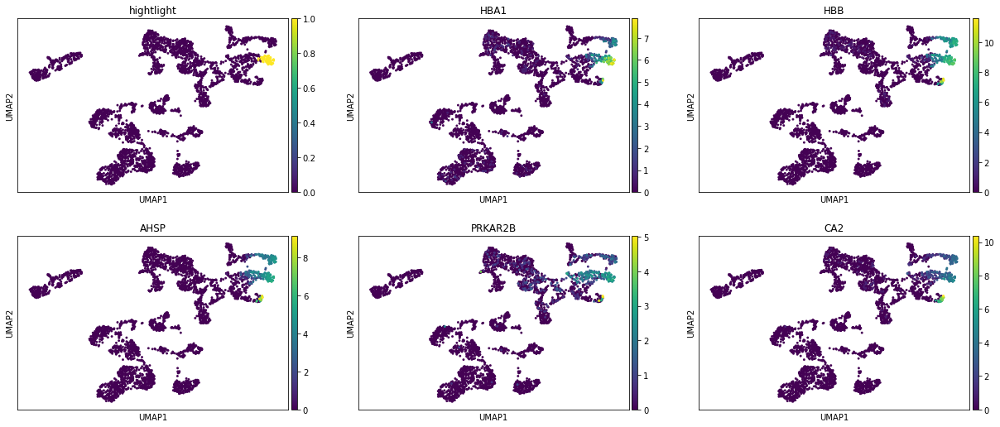

23


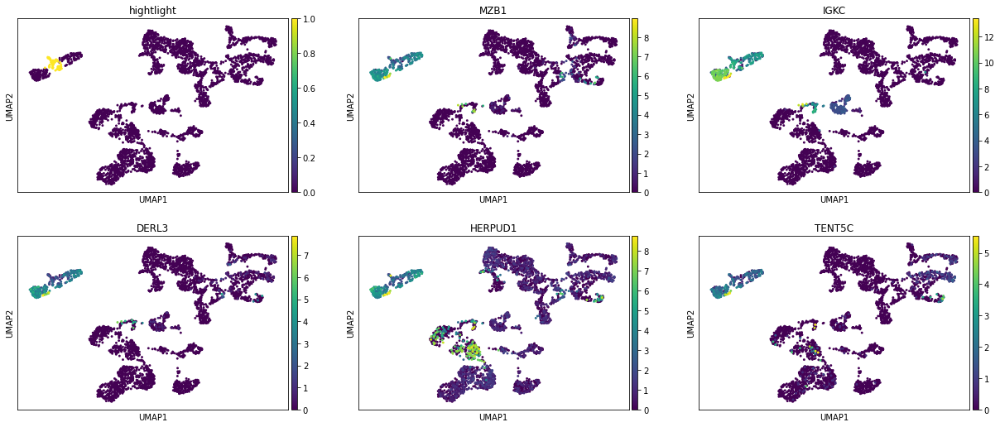

24


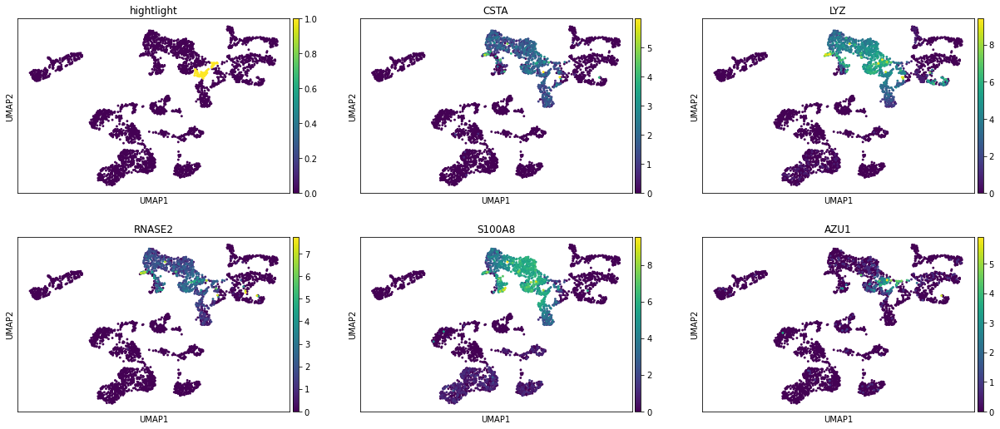

25


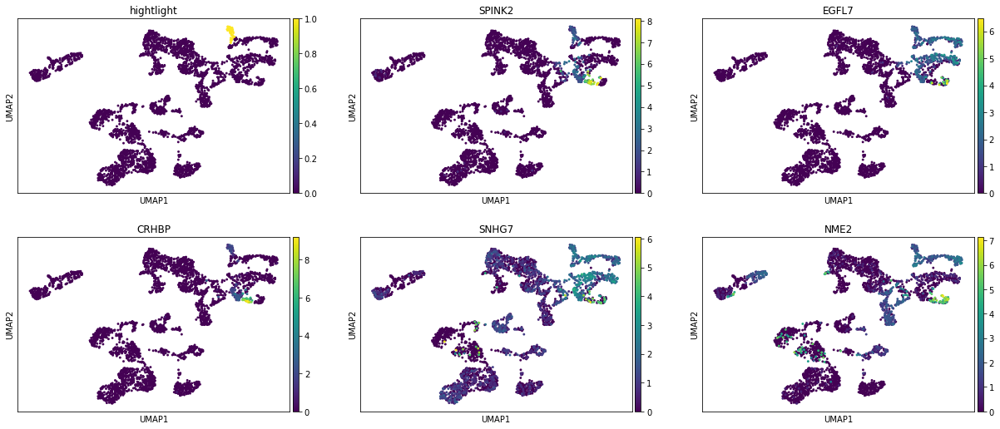

26


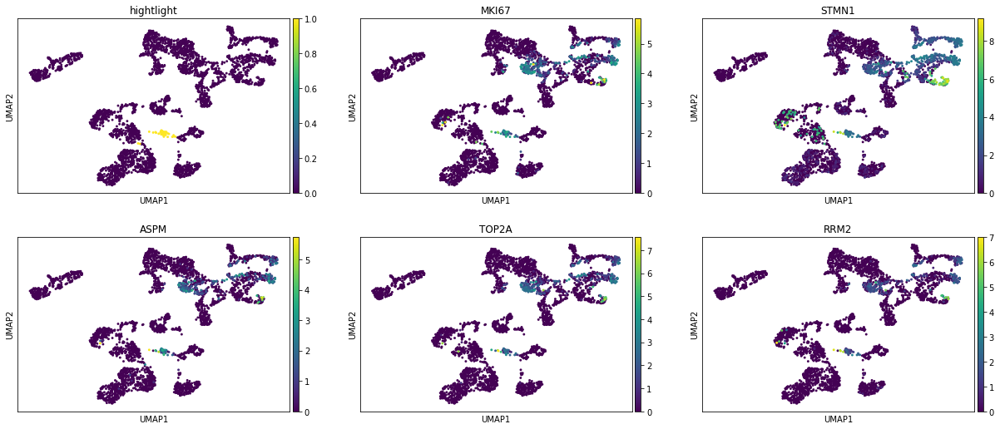

27


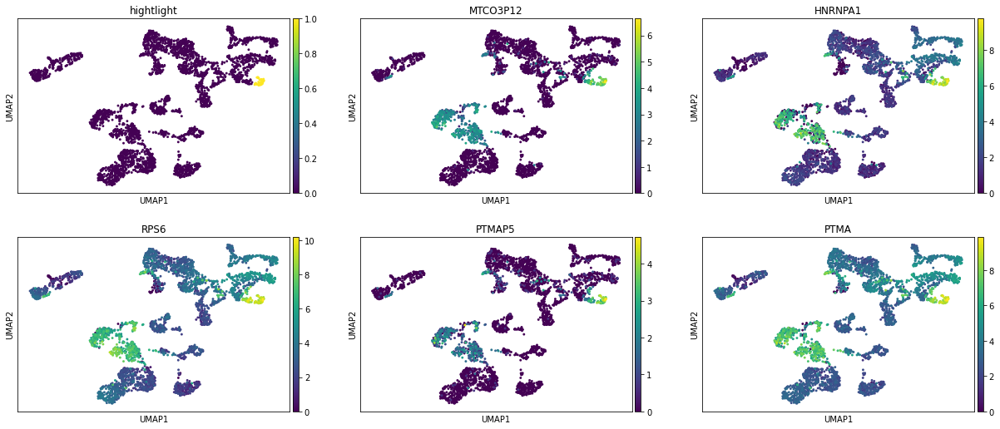

28


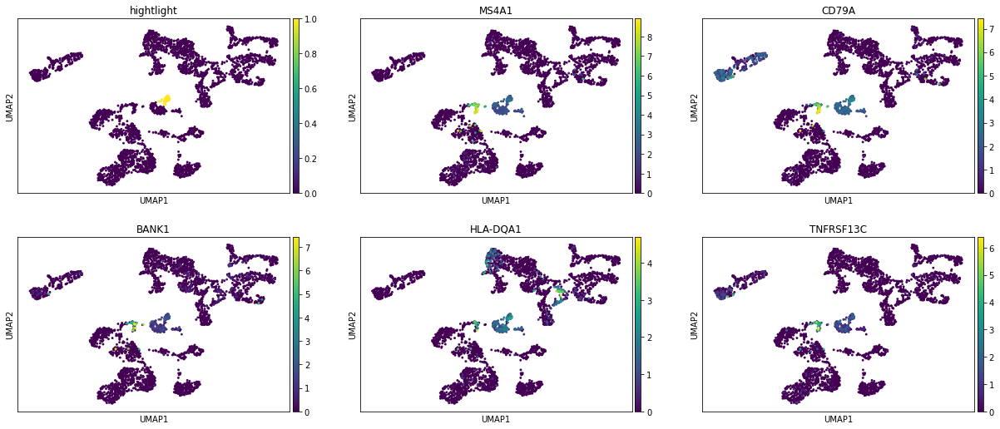

29


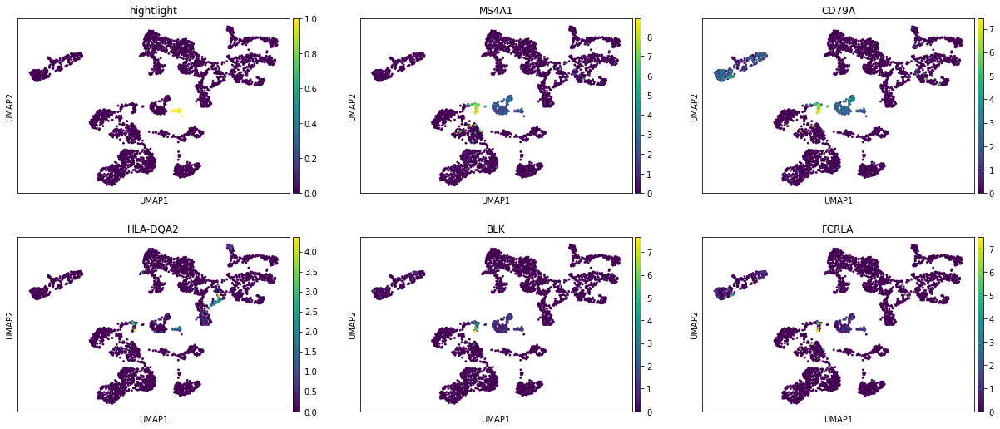

30


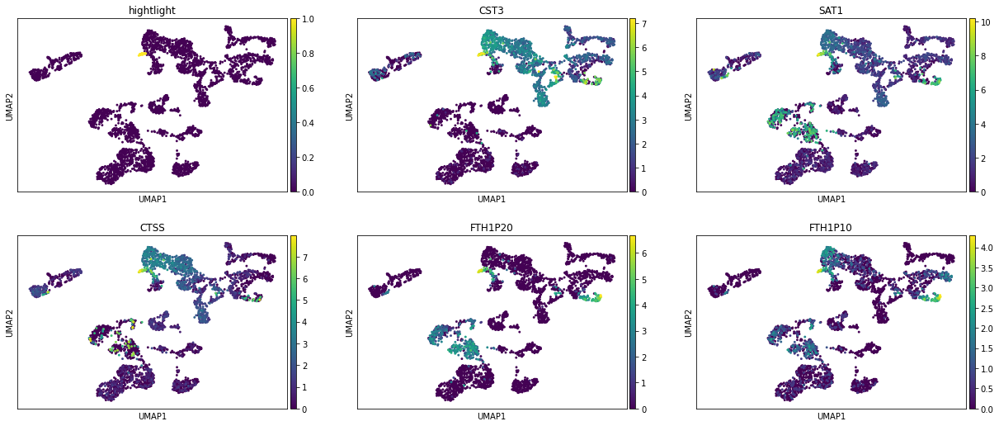

31


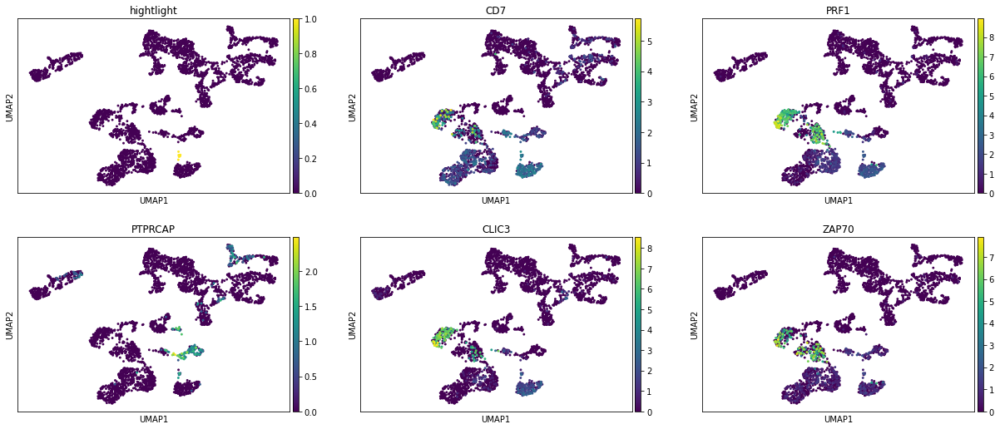

In [28]:
for x in DE.keys():
    print(x)
    topgenes = list(DE[x].T[:5].index)
    organ_adata.obs["hightlight"] = organ_adata.obs["leiden"] == x
    sc.pl.umap(
        organ_adata,
        color=["hightlight"] + topgenes,
        ncols=3,
    )

### The extended DE list can be queried by 

In [29]:
DE["0"].T

,wilcoxon_score,log fold change,adjusted pvalue
IL7R,20.413589,3.410172,7.454995e-88
CD3E,20.215588,2.935971,2.101331e-86
LTB,19.949141,3.119579,2.992291e-84
TRAC,19.710011,2.475083,2.604003e-82
CD3D,19.452110,2.345593,3.292962e-80
...,...,...,...
MTATP6P1,-13.634115,-3.294327,6.424918e-39
PSAP,-14.149512,-3.633026,6.512325e-42
MT-CO2,-14.596741,-2.226439,1.156198e-44
GSTP1,-14.920609,-3.437579,1.187472e-46


# read in cell ontology 

In [30]:
import obonet

ont_dir = "/data/yosef2/users/chenling/TabulaSapiensData/ontology/"
obo = ont_dir + "cl.obo.txt"
f = open(obo, "r")
co = obonet.read_obo(f)
f.close()

celltype_dict = {}
for x in co.nodes:
    celltype_dict[co.nodes[x]['name']] = x



You can look up all T cell by typing celltype_dict['T'] and using tab complete  

In [31]:
celltype_dict["T cell"]

'CL:0000084'

You can also look at the names of all subsets of T cell that contains 'CD4' in their names

In [32]:
import networkx as nx


def PrintChildren(co, parent, pattern=""):
    all_children = [x for x in nx.ancestors(co, celltype_dict[parent])]
    return [co.nodes[x]["name"] for x in all_children if pattern in co.nodes[x]["name"]]


PrintChildren(co, "T cell", "CD4")

['CD4-positive, alpha-beta thymocyte',
 'CD4-negative, CD8-negative, alpha-beta intraepithelial T cell',
 'central memory CD4-positive, alpha-beta T cell',
 'CD4-positive type I NK T cell',
 'CD4-positive, CXCR3-negative, CCR6-negative, alpha-beta T cell',
 'CD4-negative CD8-negative gamma-delta intraepithelial T cell',
 'CD4-positive type I NK T cell secreting interleukin-4',
 'activated CD4-positive, alpha-beta T cell',
 'naive thymus-derived CD4-positive, alpha-beta T cell',
 'CD4-positive type I NK T cell secreting interferon-gamma',
 'CD69-positive, CD4-positive single-positive thymocyte',
 'CD4-positive, alpha-beta cytotoxic T cell',
 'effector memory CD4-positive, alpha-beta T cell',
 'CD24-positive, CD4 single-positive thymocyte',
 'CD2-positive, CD5-positive, CD44-positive alpha-beta intraepithelial T cell',
 'CD4-negative, CD8-negative type I NK T cell secreting interleukin-4',
 'effector CD4-positive, alpha-beta T cell',
 'activated CD4-negative, CD8-negative type I NK T cel

# manually create mapping between cluster and cell type (this is just an example), and the relevant marker genes that was used to generate this prediction

In [33]:
organ_adata.obs["annotation_oct2020"] = organ_adata.obs["leiden"].copy()
cluster_mapping = {"0": "T cell"}
cluster_markers = {"0": ["CXCR4", "CD3D", "IL7R", "IL32"]}

This cell will automatically replace the leiden cluster names with cell type annotations

In [34]:
for l in cluster_mapping.keys():
    organ_adata.obs["annotation_oct2020"].replace(l, cluster_mapping[l], inplace=True)
    display(DE[l][cluster_markers[l]])

,CXCR4,CD3D,IL7R,IL32
wilcoxon_score,7.194523e+00,1.945211e+01,2.041359e+01,1.751621e+01
log fold change,-1.793644e-01,2.345593e+00,3.410172e+00,2.355121e+00
adjusted pvalue,1.757118e-10,3.292962e-80,7.454995e-88,7.931057e-65


# Visualize the results of the manual annotation

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead



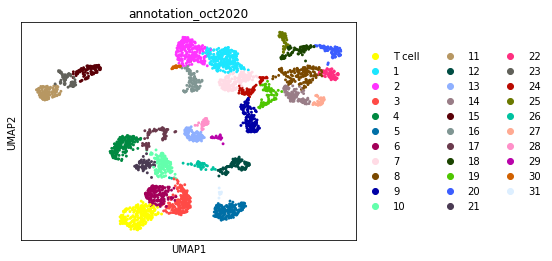

In [35]:
sc.pl.umap(
    organ_adata,
    color=["annotation_oct2020"],
    ncols=3,
)

# create celltype subcluster
This is just an example once the celltype annotations are done, how to subcluster cells in a celltype

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead



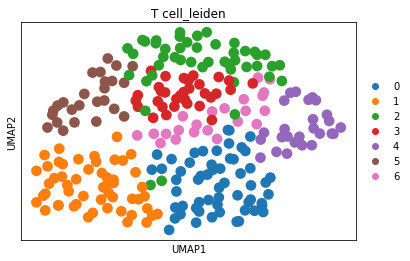

In [36]:
celltype = "T cell"
sub_organ_adata = organ_adata[organ_adata.obs["annotation_oct2020"] == celltype]
sc.pp.neighbors(sub_organ_adata, use_rep="X_scvi_decontX")
sc.tl.umap(
    sub_organ_adata,
)
sc.tl.leiden(sub_organ_adata, resolution=1, key_added="%s_leiden" % celltype)
sc.pl.umap(
    sub_organ_adata,
    color=["%s_leiden" % celltype],
    ncols=3,
)

In [37]:
sc.tl.rank_genes_groups(
    sub_organ_adata, groupby="%s_leiden" % celltype, method="wilcoxon"
)
sub_DE = FormatDE(sub_organ_adata.uns["rank_genes_groups"])

0


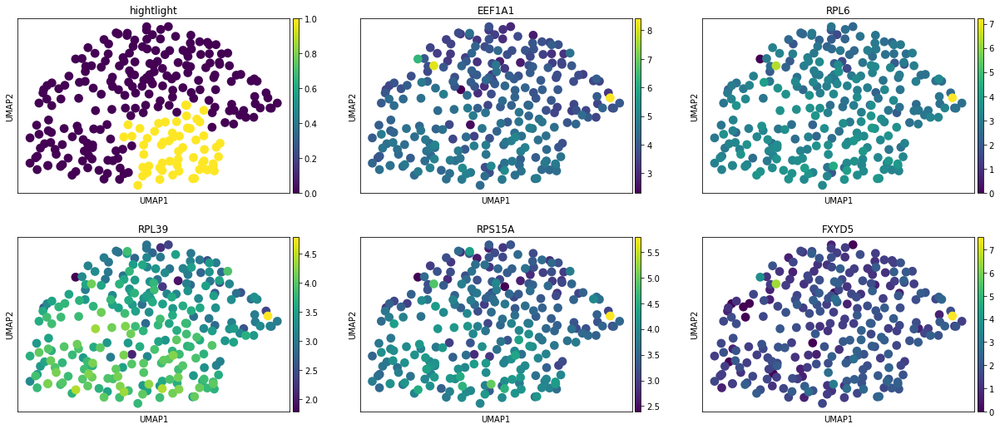

1


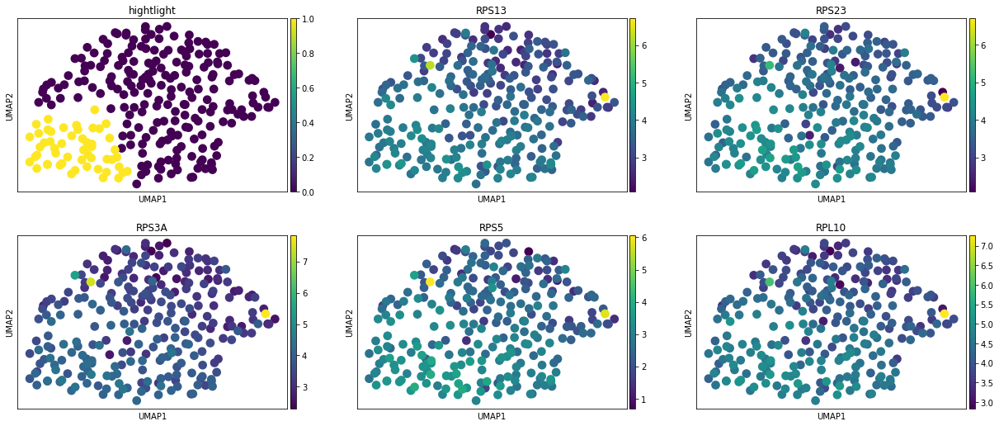

2


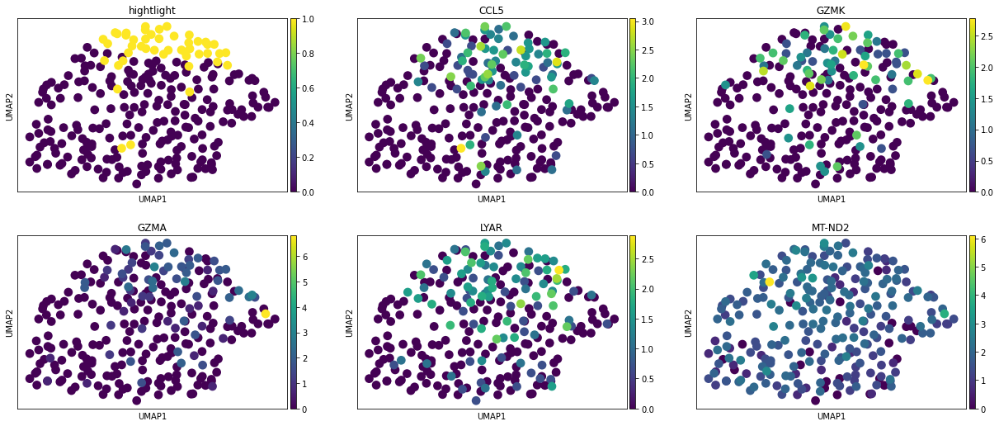

3


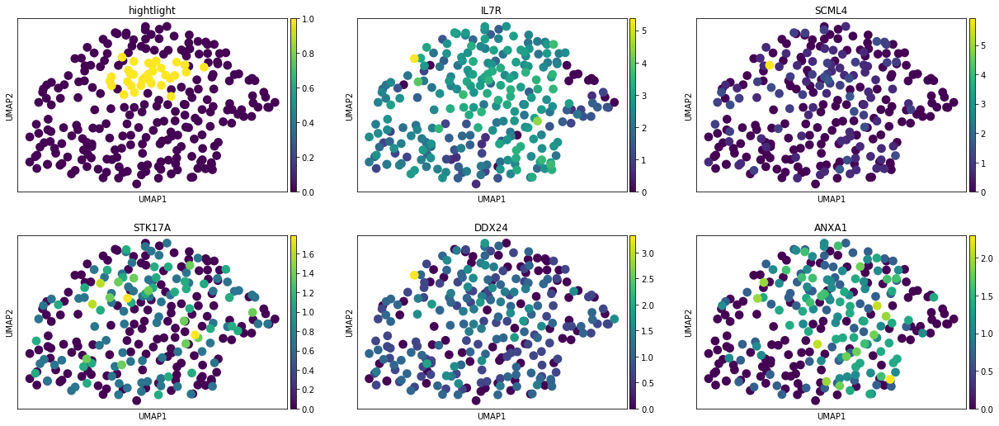

4


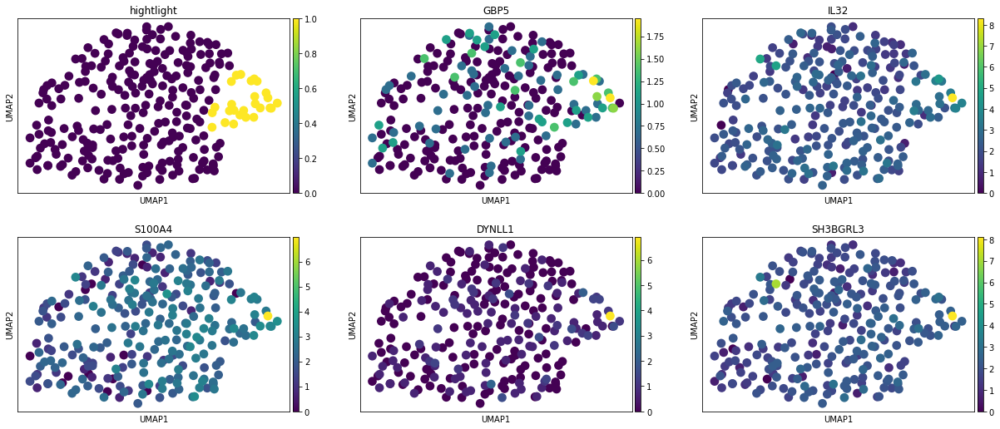

5


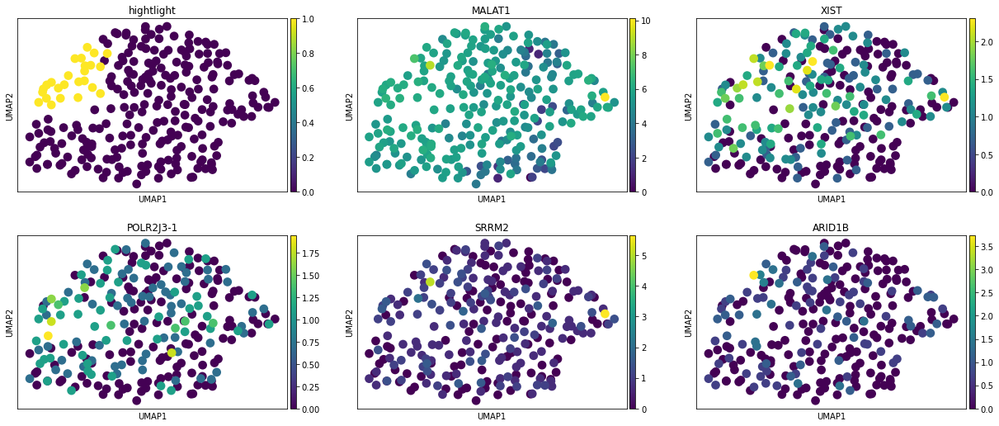

6


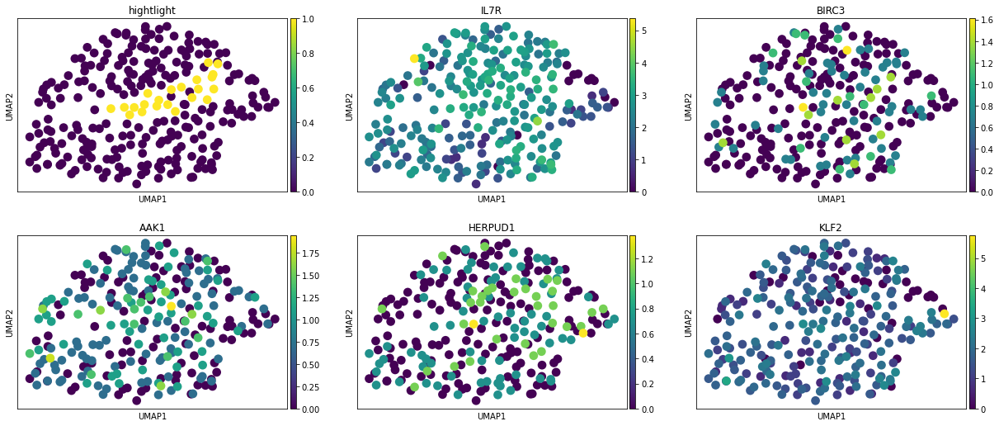

In [38]:
for x in sub_DE.keys():
    print(x)
    topgenes = list(sub_DE[x].T[:5].index)
    sub_organ_adata.obs["hightlight"] = sub_organ_adata.obs["%s_leiden" % celltype] == x
    sc.pl.umap(
        sub_organ_adata,
        color=["hightlight"] + topgenes,
        ncols=3,
    )

# manually create mapping between cell type and compartment (this is just an example)

In [39]:
organ_adata.obs["compartment_oct2020"] = organ_adata.obs["annotation_oct2020"].copy()
compartment_mapping = {"T cell": "Immune"}

This cell will automatically replace the leiden cluster names with cell type annotations

In [40]:
for c in compartment_mapping.keys():
    organ_adata.obs["compartment_oct2020"].replace(
        c, compartment_mapping[c], inplace=True
    )

# Visualize the results of the new compartment splitting

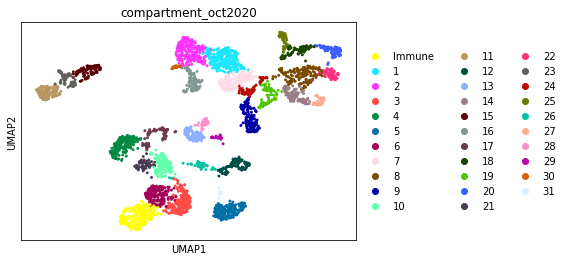

In [41]:
sc.pl.umap(
    organ_adata,
    color=["compartment_oct2020"],
    ncols=3,
)

# save data

In [42]:
organ_adata.write_h5ad(
    data_path + "decontX/organ_data/Pilot1_Pilot2.decontX.%s.h5ad" % organ
)